# Visualizations for Convolutional Networks (on EEG Data)

We want to find out what a convolutional network has learned.
We can look at the weights directly to get an initial idea. 

## Challenges
There are some challenges to overcome to understand the network:

1. **Weights are trained to discriminate data, not generate "typical" data.** Therefore they can be misleading and their shape can represent something else rather than a feature. One example: If the actual feature is a decrease in amplitude at one sensor, a weight may be trained to put negative weights on correlated sensors (as in generally correlated, so also the non-relevant signal is correlated among the senors) to better discriminate the features. (see also http://www.sciencedirect.com/science/article/pii/S1053811913010914)

2. **A feature may be represented by a combination of several units, not just a single one.** Since subsequent layers always compute weighted combinations of all units of the previous layer, this can easily happen.

3. **Transformations in the net will try to map several different kinds of input to the same higher-level representation (e.g. in the end, class label).** Therefore you can not always expect to get an unambigous typical input for a higher level (i.e. deeper layer) feature.



## Approaches

### Parameter Visualization


Advantages
* Easily done, no further assumptions needed

Disadvantages
* This has all the problems described above
* already weights past the first layer not very interpretable

### Probing network response to different input data

There are several possibilities, for example:

* Plotting signal where a specific unit (e.g. class unit) is most activated and least  activated
* Correlating activations with input features such as amplitude in certain frequency
* ...

Advantages
* Not too many assumptions needed to do it
* Little implementation effort (usually)

Disadvantages
* Thought effort required for things like correlation analysis: Have to know what you are looking for, e.g. what input features might be important

### Computing relevance of input part to output
Idea is to have something like a heatmap which shows the importance of different parts of the input to the (classification) output. See for example: http://arxiv.org/pdf/1512.02479v1.pdf

Advantages:
* Highlighting parts of the input should usually reveal something important and not too difficult to interpret(?)

Disadvantages:
* Usually require some assumptions about how the network works
* Usually some implementation effort
* Failure in assumptions or technique can lead to misleading visualizations, details matter when interpreting

### Creating generative models

Idea is to take the network and use it to create a generative model which can generate input typical for a certain activation (activation can also be class activation in final layer).

Advantages:
* Directly shows a typical input, can show things you didn't think about before

Disadvantages:
* Often assumptions required on the input and/or how the network works 
* Usually large implementation effort
* Often, need to train new model which might take time


## Examples

I will show some examples for the different approaches, all are done on the kaggle graps lift set subject 1 (model was trained on all subjects though, I use data only from subject 1 to save computation time).

Maybe we can discuss based on these, what to pursue further and what not (also on other datasets!)...


### Parameters (+ Patterns)

I show all parameters of the first layer together with the reconstructed patterns (see http://www.sciencedirect.com/science/article/pii/S1053811913010914 ...).

Weights are blue, patterns are green. The filters are 30 samples, i.e. 60 ms  long (one period for 16.7 Hz). 

One weight/pattern is shown per second, so you can scroll to specific weights using the time slider...

* A lot of oscillatory weights, some with strongly lateralized oscillation like weight 32 or 34
* Some increase/decrease like weight 20

Patterns are 
* generally much smoother both temporally and sptially (neighbouring sensors more similar, see for example pattern 6). * Sometimes difficult to interpret/weird looking/overly smooth like in pattern 4.

In [141]:
from braindecode.analysis.plot_util import plot_head_signals_tight
from braindecode.datasets.sensor_positions import tight_Kaggle_positions
from braindecode.analysis.movie_util import movie_head_signals_tight

fig = plot_head_signals_tight(weights_and_patterns[0], kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions,
                        figsize=(14,10))
plt.tight_layout()
movie_head_signals_tight(fig, weights_and_patterns, "Weight + Pattern")

We can also look at the fourier transformation of the weights.
We see mainly two peaks, mostly at central electrodes.

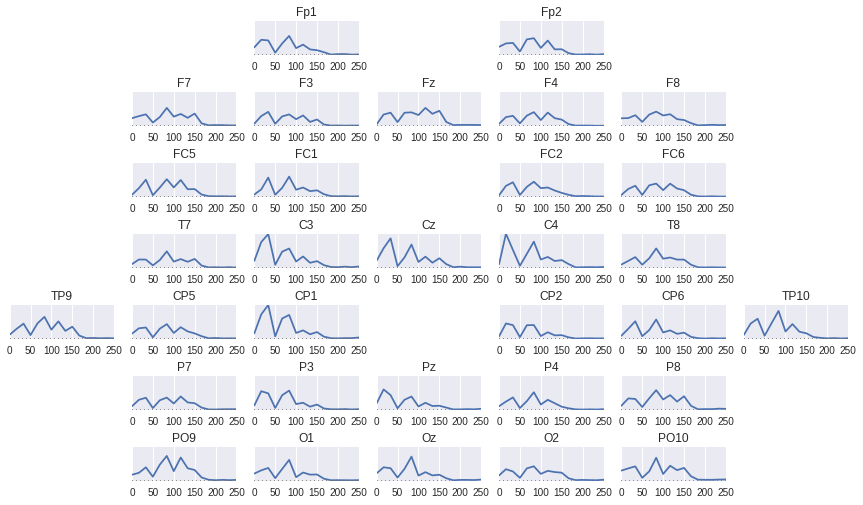

In [161]:
from braindecode.analysis.util import bps_and_freqs


bps, freqs = bps_and_freqs(combined_weights, sampling_rate=500.0,axis=2)

plot_head_signals_tight(np.mean(bps, axis=0), kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions)
plt.xticks(range(bps.shape[2])[::3], np.round(freqs[::3]).astype(np.int32))
plt.tight_layout()
None

#### Open
Look at later layer weights for time structure?

### Probing Network response

#### High class unit activations

First I show signals with high and low activations for specific classes. 
For each class I show:
* 10 signals with very high activations: Always half a second before the sample with the high activation
* 10 signals with activations inetbween, ranging from high to low
* 10 signals with very low activations

I cannot tell too much from this :/


In [308]:
from IPython.display import display_html

class_names = ['HandStart', 'FirstDigitTouch', 'BothStartLoadPhase',
    'LiftOff', 'Replace', 'BothReleased']
for i_class in range(6):
    fig = plot_head_signals_tight(wanted_blocks_per_class[i_class][0], 
                                  kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions,
                            figsize=(14,10))
    plt.tight_layout()
    anim_html = movie_head_signals_tight(fig, wanted_blocks_per_class[i_class],
                                         "{:s}:".format(class_names[i_class]))
    display_html(anim_html)




<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAXdu5tZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAP4/
ZYiEABX//vfJ78Cm61tbtb+Tz0j8SD9OaxRuF0L1+r46YAANtyunixyGwB1/+5QTLTSMNCyToFrw
bKRFeQsDRnT3xKVYzZdM4UD0brjrLuBRX0vaQ9VVgAXolZbUCvLsTZWokZfpyXbANZe2mr38Ot3I
ZeQH2Jx4rXjuLmnCTHVW+/FswemtgU2Ri83CLYIS7jQMDmvsqGC7AEWV6xKYxYBwYauI9//Ce2bb
nW6wGmenPNYqhtCY9EtY0PNfgboiQJgHgRJyzA911Q+wNKJ401/59pfOUZX5d5QvnqMxAPe0V0rZ
1KU13Jyn29FCYTkX67A3ycSPDYP3G6GFZYHBSB/dpJ2vU4JZ+lKh0Fv8I6gVGZ0Wujtv47snoh5z
9xIbw4tlxyp21crvMZpi3ULFItxTd9nqByxFOnMQ+fJ37fmtDSTchxETmqh/JsybyYh83HIfFhqj
5FXBVzWXUw4/aotujiN+XV5l+cCR/oF2Q1J7cixOtXcZLIcWwdZzO762ocewSr9/YG9s+u0xjcwr
OjJAlP0dOGanJVAbcvREbdcSkeaFLUgo4MRjUaxiBYCZt2XvSjicxmqw1bpeZubRRNOQEHqDn6Ya
1qzkUKK4sSilqY4j5lUJTiweFctU1tuzoT6p2tOpOQdQdE9F/0v5VcwcAO0dfu2buLapNaoI5tN0
qgLr/i047MOmY8SEU+TqVsoaJWvNRD8n/lAPy9AJyQh2QS71cEQDr47a9A5E8zRo0KKwjoW5Buhw
iF6jOdNL9azJmx/rctAMWUR3m+0sX333oHk91b3CJ6jy//6n1MzW8f7X3GLkWDsN0EAAAGC2q+on
dL6oniOm6+Mn1a3E6yg7tDKalG5GjMxrW/KNHXUJtuz6Ud0IR9To+rhnRnsBJINQ3FB4lBIlnjMU
zdODa8zmGBA7Y/eBDLuq6bi+FIFml/PeNmKNeGsGNokk6lEbV9I0UVidwUdy/97XoqWodcrC0EvS
8dNVShNuHiFKYhh9pA1xF6DRuBaftiGGKehtj56H0KJmw1A5ZxbUD/aeh5kHp5TPFfeZDtoCgPwt
+KzVzbEUTlNEjusEfUZnV07u5KTSPqdyG0DlGs2CwOjAqdXBggJo0F7UFLDOcIAk2t4AWowiuVFe
GH2sbPkkLmlprbczUQv/wAkSQxXMm2nZTxcDNgTbnwmN1jaattHwLuayEtl364u4PKugnOwLM6ay
aaOeu7GN3NR7TXF5oDjQ9OzQBsptRlV8MGoOcieWSALzTDIBFCdZPOoG2rLdLoSnnU0SEdhOIUlb
ZnFbDRjR9rGMO+7MJpZa33/pkRwKs0EvQneDkktQgxHiq1ThweMAWwqacFUPpetKpfRlxTKdOhtv
AicEUYWIOuQTtDs7sHXw+TVcwtR0fjH8oagoa6XoWzfOORCRC+UCJ5PuS9YNKBcfSDuakOssMyi0
cQH7MkFkkg1ooVkP5wdt3XJcC6y4le27DY3ypLEYXCszGxoCnKzfVOIkxgXXwhbvHpb0P5CNuuMd
hZznRbQJg/Rnonw+PFIZArKoTBSCI/J0DFABiawg7srtcUSPgYpy1EWf//tOr2lG6fkQAlTQSJRc
2MFKVe0zbzckLrHkUPOcyNOnQniaNPrcMZ/KBA1uLolEqy0qx23UctzQQ1/7a0WRqTxGEAS9/Nec
ZYx+NN0IAc2cYP6kcIoimjNZ6pLHo/6ylktLmc9tLUNPRwzo7aucH5ODe+l3z+4cuwIWja0Ey7dm
GIwZSOwuxeE9aYcAX4TxKEOJOaVIVAb3EP5wZrTEy/84L/MH/wdacoLVRe6r33Vn3lJpYWBX1ild
h+qiWYTvw39U/AIxC3w1Tc7j0B1DH/VrXshkrFb3ERJJTsXy2OMIj9dTGdGE4jTQhJGRstIISgfV
fV5NxZ/lqMJc6WLkSuwN52juJoyv191MRVUdpg+l5CryeCMXV/PolGbZna7GUkJ/veLvDfxy7Ie3
FvYAD0SrHwOg8s/7Ix2CYcRvyO78K3tPPaYN51vqmvkbDZcBrAdhwg5BDVXH7riyBYF9uncxpRRE
WHuQ2TqRVMUmjLitReRpRtczqlAjZQN72jAmGFMHVSLIwz5YBrCM5MDBQAAAKaAWUTJe0fpypgJQ
Oyu8IMmA6HhzAFgJywTV2yeRdu0FgTC4c+25IcOXbfsnraY/Gwf+7ORPQ0tChH+RMnqe4slRFNZ0
CiLQ0ToonGu6EAKNAMmRwVkKdDz2gX77UrcwOZAnSwT3p0g2e/HPn3lxuO5iGhIt+pj/Gh9ZxXpk
nTzWPGU++kJASKTf5GrpCYPPfoFo/tLubRCJnQ3H3tazg4jWE07/odH52zvs2wz9uJa88ZLEepvu
kCYl5YkRvQ83zt0iLcxBfJYa18N2JKdftPwmMI/x2FOw3njl/yS1Cpud71v9Yp4uXz9Xozp2wWUN
rN3I7Pd3InS7k1JwFzbGvVGwQ2JWSMUa0PkgcgIJF/tEXP/fpm606H1FYUkSUbTGEDTSWBZEdOVU
8gqzPjxkLg1pH1KTdUqyFxgOVrtD7APORdxRpu0kHhyFx2RnwrK8iW3L3zFHfZ8pwgxUi6f7+LG5
TrIwYD6RN0BpipkctQkQbUxIPCGXNOPBJIKXZyLmtznsBIJnohfHBQaagBlN7GFd/e4jIG2pHnmu
UxCIrWgE3yFX3H4DZcYVoSw2LY8vWuE6MeCNR0R3wPwvyN3RSxRjR7rctp2FcyuAYEmOVgG0Byc7
/KH2vst6Sz/Kx+C+Jngo++muG2LPwZnStkVgXsr8jEwOcW7fOEGLUi47pxaNK+WmS4Tmxx1wxCd2
UURctCSeBimUVEqiiz3KqBrLU+C5NXu4tQZkLzR/2OCcYze1YN35IX5mOi6VF9HRb54Udp//3M+f
yZwqnzw5QovG6uAxKz1u4CIGiFVs/x8IqLwO

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAXxqZtZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAQHm
ZYiEABf//vfUt8yy7VNvtguo96KeJl9DdSUBm5bE7TqAAAUCy+YGik6oBa8ZikkCHregIOrdionc
H4bvqffnbE+n9rNQh+TyTWawULTsBafEPUpPu9D6wrqW24NqdUwVcMqG59ACaLIIB6G3kZ8+ZS/S
QPfnykw8DzB3Q/vNM14AhFvx8J30wxZ7N4u4LyfNq5uPRz3+YgE0SqWnermDod/Ig4j3/8J7Ztud
brAaZzm8YJvK/cIbg4NWb3dQTL+xMA8CIarnoifTpjppRPGmv/SXEHyjK/LvKF89RmIB72iuld2U
pnwuFX0dXOUD7Mwl/0UqsYKeetRqdqpR61T3wgcI6GpwYlP2NyWc67VpZNHOi7avKvSylTF30xBA
CPtO4nk7OJeR9jAk3M4nOVd0EBnYd7KhzbrCGn+KiU6Wj1edNFM+1kuT3FUaLhpQN0XDCHTYiCmS
VjNGTqzq66TrOGn7hmw+THzt+a/tuaxP/nALJUyIX809eUWoYRNYp4zSt4j2q23rJM1Sx8ZS+Dyz
fzZ4hgIeNrrEXvdMMhKQSXJvUb2CqiLlhE0LSlFlE66mU+Qey7kCsK6S/GYm7s4SaRtpxTA8npMC
7wlHff101y4A7qx8uxBoGB/XyWpqWkPugaR6lki+l76vAnW4jMfBoc/3A0ravNJa/RqPOd8a0zWd
ftoUm6Gw7qxCicKj36S3Yo5SvafWzVDnJyKfhvV2u6HTIgkiEB4vNmMSxlYmj/U25nN9/RdxQzhq
7a/QO3LfCjIndG92M62PQ+tBjjzrmWqa23Z0J9bcgupOQdQdE9F/0v5bV9YAdo6/ds3cW1Sa1Qlf
M3SqAuv+LTjsw6ZjxIRT5M7v9krvg2yL2AyeotaIEEtjGcMPl3q4IgHXx216ByJ+LjSmROMxCdFv
VHCIXqM+H1rrWZM2P9bloBiyiO835hF9996B5PdW9wieo8v/8mFPKuuWHCJk0zv3UNRgAAADAJF5
gNZcz+c1496iuYmOZ6/dY3p0PQrS3MwEpkWd8F/ckwwNuwP8z2oza+wJvXrN9jSiU91b2UPAg2E8
Z9/DfRDj2C9fv5mtjrN5eXdV03F8NI+HV97clbqRAuxoRFru/aTxAAr3//52oyzNx2+mdLSBSgjC
Y63q2bw2lRFy/a1ctD6qefH/XvRZMYs7+mApv/E/fJsU1u+OLiN6/z0Vrtmz/nUhF72hdT3DFV6J
ImU6oXuTni+UkygMh7T2XGOb+IwrDqHohtLWDbfJqqxr5j1l9MlqAuwfzShD8e6a42Q2OLllObd1
S0lNMl96nucOxnduefUH5Et5MubqTqmDcXIiRBD4r3cbidZqX/jMJzgt0p4UlfEJ1t8jEEX5VN7p
fCV1xadd6ZqcRgOQRCokkHHwqdeyT/v0yxZdcUQh3TxJyTB9A3LPiWRwkbwv6pdmuQ7c4cHa5l5i
QnB1mGASRSlrh9AsbzFRmInm7gCai/pozN4Q/7aeMNN3zFHnRVoePdk2TY6olhNx4cslOyp8t971
y08eA2ds+DzQ0SB4iag4O+nossotLKNl9mP6DuNNZq/64A1NzmndAl73LLupABhuP7cafcK3wWEq
dT9e65LMNf+Evsa92U5tn4Mjxy4boX/c9fm7zcX9n6fGYJ9iHjWFh9wXFCVsqJaAvc55pcgdNynk
KK12RWH05xdzT+Lx08nCxQexlHydGMoAr812FTsljXpT9kxSmOrc9SqZHR28XmT9fmkEbx31jhji
NpvobZOdCyjg3oNWMLz8Zv7S15I2ToA0t0cifgi/OCLuksOT73AkVMnYGjJUf+0kHr/G1ofWgTuw
XWXjPad6A3/P3Cd06L2MWagNHXBWu/Yd187ofjJwMoPzFnPMmfBaGkIktw77zxITTkaRKxV1DWy+
s4IdPvPm2J5XFv4LSt62FfOBjUIVZVbeQuXN/g/25fUJUHzIBfNXyND43rnLnpHcstRDGeC6N7fV
PwwwCFE+QWD8/+JP9H0oPNN/eSDO6Ju6ThvgmvvaBAKOanltjJrj0LUDxcopEd1dRlc8vCGfzZmd
CvfTLi5tyiLKjDVByGRZG/DHpYKjgc/9I4h6OcnGlHwndRfETdynZ/lH4rKovxXshExJ/2/IoyTF
6XwtWsEM6CohZ+b1EokrjT+3sAkCTR05+uVQVyNlRIV56fWhq1JVTLLwgnTIQCCdUuuYYIWzqe4W
XZBNhY/Hhk4NIAP6Wn2VFTZzo4jzeragbUASWxpkWL0WF/P/pEceor//Vm01n/YzPsQQCWKRSmsM
tp0r+dz/K5b9h0okY9Dg1ayXbyo11ZqrdxKgrw3FMsR5R1NC/89uIkfEej6nOxlGWkJa0PkwVIYD
f67OU6etB/OxLLyQC8v0327HwIl2rYK1Xv9goBUBxfXqT/lAkhIUsCwqHnpTQf5sAirRbbjUfJ6f
mzgK+62LITD7QR+DBaf8OYg92/QkInbJPerZuJzWriX5IUZMSvHqkJfUDNO/Tb9gPzsGuiYd4d+i
uLTZNeq2x9YXB2Ww6f2WKNiY85WnsmXCJfEMqw7vVl1UQI2x0zkmTiA82e/tShMMKYgtSmpPtL0I
KwdBhdmbgAAC1gDJzLBqpq2vRMMUeaIr+oaqEUseV871BzzLLt68+nj95z9lbIgvxb7xpmut27qd
3fvVNm21UHcU1Mgkca0SX0xxkKtbfz01+LAkjZYVg/pGMp/z0qChMS+pBG84VqLiYXAai1iK/orA
1U1lufI6ggJr6+6yy8KxbtIXSIVXQgQYmeqZCWxlSTdvH2ujiUYKlRU/Dad/3e8njfYp1L6mNEen
wfZskyEup2MJ90TNELlNOJd2KoBa74T3jz83qZAKqcKYPMZ8S6DM+QvfaHit8qWS1gDPpb5hp1eg
tiRXatvjkr3T5xp9iWO+Wk6dWYclVEonQv1p

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAX8vptZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAQY5
ZYiEABX//vfJ78Cm61tbtb+Tz0j8SD9OaxRuF0L1+r46YAANtyunixyGwB1/+5QTLTSMNCyToFrw
bKRFeQsDRnT3xKVYzZdM4UD0brjrLuBRX0vaQ9VVgAXolZbUCvLsTZWokZfpyXbANZe2mr38Ot3I
ZeQH2Jx4rXjuLmnCTHVW+/FswemtgU2Ri83CLYIS7jQMDmvsqGC7AEWV6xKYxYBwYauI9//Ce2bb
nW6wGmenPNYqhtCY9EtY0PNfgboiQJgHgRJyzA911Q+wNKJ401/59pfOUZX5d5QvnqMxAPe0V0rZ
1pgbIHrZLJy1g4iPNvrr/yCUCo01UOSkswNRm26UcsjNtKfvN9wHT+42dPnAz86E1xzk+rtNbKqS
ex70EX/7WDJLr4UH1ZnfshfHmkVgV9MRl/2MOEHWKgohTX9bqnbDw1ki6Lx0+GjHKRX+5N8Cu3vM
qAnvXTXt1HhknmpVzXWVF+c9Kxk1g1Lqqf2JYAzsSzJnPm8ohl/J8XwLS9PTtsTHxX9xdo49Kv5w
L4dBI4RVuJzZFsC9jbQdL7kMcXgBQ9hZNg+q9ocA8EI2lUt+9hJoqZJ+fA+szaf25Zqu7Trx7Cfm
iPwMajKKlnKeCpbSaJUTqKinLb+JFL67sLOhbK5JEMLZkR9Fo0/WiNK3DwoxznzYnPN02sjAcyu6
WMsTEwoaN98BY46+Fp9skseSOERwhEM1UtsH1sqAbK9E75EaPYFgJYMf89Eh+RZEIDxebMYljKxM
r8Sn5lRkkNECjdZHRq8XaCx7ZZ6Mqby6Y8OGBk27obFfjCmFmcVzj9gus1QZWiyrHguzDO8m1g4A
do6/ds3cW1Sa1QWqGO3VAXX/Fpx2YdMx4kIp8nQLuyV3wbZF7AZPUWtECCWxlH7cbHq4IgHXx216
ByJ8ujRoUVhHQtyDdDhEL1Gdc7fGi7HfK1X/uw5GBBPtGRT3WfEIgJDFffTJ39Mwbw+TrtSHj0VJ
rd+fQOY0kAAAAwGGelaO2zg1Ryj2mcbiyhsPM9o1yo0QYZdyNGZjWt+UaOuoTbdn0o7oQj6m99PO
xr5kwRcu2p0XGStyIUsTUZzQBSAq69ttI6VumP3uftuYn2qgKfOcSGyV9aBwwsa81wy2869sa8xr
CllPw0iGVKVnfM3CCyfYSLRRrwfprpEVNaLHPeL9mSen7Cfjb+Dy35fUaKxJCRf6x3UPnFFg5kBZ
ZvOg5uCuacrS48B9lLRn/0QCkVTqpBjg7zUaIjD9+K+bXSJd0BHMqPQmlaVE1gNeTt0rbxBYkQPo
XSOck8bKxTH12sGQZ6WGJoM3VLXrM5Mk8j51X9SQk1wGwPN1s5Guq3dGX5pDtMW1+a8qMibwj9cj
xV2hEhZ2PSmXvfdR97e5+xO/kXEBEDxTuIExCVB9EDwwOo1mI+3Hqz8B4mDa/ui9E0hK/GBFFjZZ
4zWVMq/j2bQkEyupmntp86Ec6KSloxW6HU8Yt8mSL92+lFZbH5cnq8xdNfmxdmM4tAzepLETPXmJ
Hsxt5DIK4gHeie8Dv6oEIdd9azXLiEKUd1ESwUhtx3RTEPlKK9dHMu5FegYExp7ieSaPB+Wpza5O
1ucyaTtw6fjJatfW+qI9zKCSxSlRcDg3bmjUpumju5Vib8KsufjIKVnPAsKOUYnLwA8wXk+3uO90
kQKOCinCS6y/5Wq6aIcQ7AXceQNG+lAA4sXdVtL2oQH/Bq6eO8i9AEHiExIlt2fkXiU7Spz4d0g5
3qkk1Mkv/efzWkXmH5fP2ESRH84ZbbqBbeGoOfWMda0nHzV6KtqOHOsGaemGbsl85q5rDrd27PoI
b2faCQUbD1Rqnm5pJ2sw66a7fi5xKwxwERNNQgdLkouvFWtbBznuT3RTB/mhC3JaXqhRePItkPMB
gnWPucA+Fm6yCEmNq+qf9N0/s/5uOjr6bF3jD9ueTKHP1aQ6Ncj2wXI9zODZKbdlwfDpQvRuGpt1
t3l+38JmXoZL/Kg1FoDIUNEXS04zGEbfx4S7wk2oGHEpN+357t+U7oOyCyZFRNP7XAZsipREtYQE
vJP76hd3uVjC7XCGpIf//1rCcJdiqqPg1K+PDrbvai1BRXvwk/vEKsR17CVogr9rigN+LqkrdqLG
Z16uv1NuZH8vzYIjBv9F9NBG0x02PNpZQTwO136pDEeOo/LbsTLJ6lT3usn48moDh4ho0WCw4Iji
NEDRaUJ5PUxk8y+JpQ8UFRWDaW9TuQ+yEkCFoUviQG5FXcsF/ZbcXqIuyZH7rfIkgv+IyL5m2sJv
yBDGOirE2Zw0iqKVlU3qNuzPYe52J2IMMDKbx9DgZdVw1NpNsPx56JX27AB4y2WUbCXJuOA+g/zz
XZwWFw0oWYh8eXk9ej8o7k+n0qv66xqcoEt98HT2iJt6R0/AN/se6hi1LIwrLhp4h59JnBnU991Q
N1yBDbD71UtRjVCmKF4D6ImFqp3sl5U3gs9AWVOMS0fa8g4a/xMaJyBXS/IusAO3KCnpLh7hawuZ
nlta4EailOP5wohouKcRZyKacKVwiJ8ppDZFBJbmYaZN1VIPfmegpySGu9EEZIj7crONegqkO2Xp
HOjoO79C73chG6KupUZ1Wx9323ow5w9BhuBKtpieo8fygsvfO3H/lMzH/x5gUpacGm5DkCVXhawY
znN8ex3MMIJMHgiwBeYCGgOGKxz+fek/5kxgywIOXqvIWpmSx4zWVpmB5ITCVSqmpC4lfnstUi2r
9Fqf+ZxhVPRhFZWzl9Hoqfscwte995+DDc5M3g7PLDVAuqacEYuE+N/wYsvAj7cFOToOD0rPQyEq
ANUWcaqQzZHnrc85PlgvraEBwMzFTe9R6cJndifKCa2XblvqbAfZ/SGMtvsQkZ+rfioaZHWIt7x4
Z1uQCbKWDQbPz7Mau2Hf2BSaiMIDVy37gNUw

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAYMKttZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAQlY
ZYiEABX//vfJ78Cm61tbtb+Tz0j8SD9OaxRuF0L1+r46YAANtyunixyGwB1/+5QTLTSMNCyToFrw
bKRFeQsDRnT3xKVYzZdM4UD0brjrLuBRX0vaQ9VVgAXolZbUCvLsTZWokZfpyXbANZe2mr38Ot3I
ZeQH2Jx4rXjuLmnCTHVW+/FswemtgU2Ri83CLYIS7jQMDmvsqGC7AEWV6xKYxYBwYauI9//Ce2bb
nW6wGmenPNYqhtCY9EtY0PNfgboiQJgHgRJyzA911Q+wNKJ401/59pfOUZX5d5QvnqMxAPe0V0rY
+gDMAysvYL2SgkHstE8EKDv3rMxBQvh8In6I79gQFGS3qSu9gyybpqO0Z1mpabwBmGDBQZ0N4UrE
sIlR10oI+eOZZkENhx4ex9rZ7o1BUGNnJBHYSfQH0dY7yuYZ8isUqG3hodTWrefz5+f/FfGWMyLp
15g99wDp2Dhmmod0tW3oQe1gpCWJ0wwAyhcjE3as6/mW0CsJVTzO1VVMljnyXmxxtz2F5ezGJTiS
f4dr0iiuSOSwAzE5pd91decmv79so4a5trzekLO9Yhy+v2dBfkFQwxBkeJSeAHLtOpHqFNfPTZxZ
D+BgJXf7XrPzBwDv/C2rCWaj6IQHi82YxLGViXn3fOTrfDxNghbud/GJoN6Swy+ZE7o3uxnWx6H1
oCthYLphGtt2dCfWGC1gep6wa48F2YZ3lZJgcXaBrlBY3FtUmtUIHkYconaipxacdmHTMeJCKfJ1
YEoaJWvNRD8n/lAPy9AJyTrS5ix6uCIB18dtegcifUY0pkTjMQnRb1RwiF6jPP9a61mTNj/W5aAY
sojvN+Lb3a+Nk10fU/fTJ39MwixWXVwU1+jDNnKgutAOtgAAAwDjDtBNUddrkYWcpVRgAaLfme0a
5UaIMMu5GjMxrW/KNHXUJtuz6Ud0IR9Tw+rl8dFVEpacPRVYDUNWISJQzfRDj2C9Y15mtjrN5eXd
V03F8KQpwOZ9422T1U/2LDtqOSduQL//9ctlYncFHcv/e16NMSQ8ZMsfdEuC0ye+T2ex2l7WDTqG
IQBbC148XQnyHEBBfVXyox2mv1xDSx9L3cbI8LS4iyNTxlRvBlOeOT15nErqaWWGpKqa+oDCRSEb
VWNcAy+xoyLVYJ4qmkwrzBHw0LuYAbcINrFZ+qy3eXfPEWJ18o4dEv0diST0dobbc3r2GJ1bnfrn
hPQcoUo8OcdbT3AMyBVyZfL7XKBPrUSG+4vIaJ18lX/yX8ZOamrrp4eZWt+k8EogfaBDpAl4uNgY
vpFlbFzTgLOobyCxPxdM50b0UZ9OII82AhBjF5nP5XDuzZZNuAgDC95XCeUwWltDZx7i2RkD79rf
PGvRsHaacWfZRJNG0SRleSPTOBJGbu4PCPyA6WoGCOynsitNiHwAXTREfohsRo6WclbcLoyiUvmM
TByOcZJ5YDmv4tMmTyyQIPrZJqrNhXj3o8Djnn121i6jLX74ZK9p3c4jJ4/2lB5h6FKlDLzCjjwE
oyAaSJeCHeDDDJYdzZpv1tp9OEy59nxXUfscEUaG1Vx+642xiNNJ+DujrQXkwUoOEMo4o0nxiA3d
qhhTDSnErT7+8uIbQKsUlUqKrAUvcN+7zVyiS3ZGGfLANYRnMfM8oAADegMLSjAxDH0eExlBjzyY
s7uV5O0RhbI8ThqTCoCv5CDooez7/JRCTX7SV0DVZ423tEo/TW+NsO27xqgyRMGUlqCNJfL9+PMD
cBpzg8IbFazIhwUmkbVUkRwXcYQTUhMFuTGzU3XTF4fFSlz3mVg8OR9Pa9XB6T0KdVJ4wtjJWsfW
4aU3wWkbgA6MJE2ihmBbePkWhB+PyiTKXdu3KzfL2iF1oVgJhOCY2LMfqhwe57/bk6wqK4CKMF0l
9QyXH6Bh/vFxlmleKXS7CdGMOJcsbJhx+bbLpqZ67FRHTwCcsfPSBW7ZM/cdXzAeUHIj/pNLshRn
GBvaNBngJzWA0U/Ux+XI6YKjxkO8NLrBq3yyHdbYEQjwB1e3KTpkbTQFLiYoZ9PUiU6PzvHe/6Tb
+ekmFmtiBl3l8SajkME5jpW/kMTF/uRDX45aUTxuhjvylABXDT4B0QIpW8o4v/53vjHtnhqZA3tF
Io1V9Lh/e2h1UGo6kvlMIP3ReOJJsCPvwvH7xD2xZ5dHrGHdJYmzPYYdiAfNFdWQKqrZtHpLSRbk
BuvKEYoqH+nNCGTUomSnvE0N5edssTmBvNJFRihpVBD1a1jOyoewYg482REiXO2PtqvTCnA2OaCh
OlHI9QkL3hSj6vQKRRmb0Ba3iatqW9xlR/PyyeQnwCCvTmrp4FqjPK2Zptoma+0FrxyFqeDf/mN8
QB6TaqGgGwyfDTB4sZqbMTCqREtzyadFWuadS9oIEkO9UoHji1b3ys39Zhi7kKXcxNIP/EXx0ILQ
Xxcx+Yr++Ihno0fGoy/mLgwkyAh5Y+k25JY4A9D33cs4yqsv60IgiXykJhJt5cPArwUWwKM/7fbl
wiCyVe2Pwh+VwAQJDWsWh6K2HWQ7kOoeskfA5UnYlZ0U/2vpdXHpcqfOSfIDtEeXynomkPy2ck9V
lXM/lumcz/bX/UUf2tJ0aZ4G68hosOK8lT0RT4UjE7kcTCMaEqutW6N7/ospbtjVZaSB2JTfsrhS
6TC1C0/XSBuseEDE/S9J987lawmpVbaOD33dWDVaK4AzkvvkMHH9pjRt6AOgeulV1CID1Sq3IGol
g1HnWvVRG5EkqGHVVNm9uiUif9ilhG6V1ie9C9LZGjVIDjEeKK3zUqfrNNq8g8P28pnS0NQfWIft
xKo6FRjnUCfFvB1dyT1aUbTum6bQLN9wgnFueHJ0SeopGftQZCey15n3xifPqNDxOCHge4Qx3KTX
22AmJMynyQvyH2mtv2JXC0Rw+w0cfzJPWNDt

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAX09BtZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAQEU
ZYiEABX//vfJ78Cm61tbtb+Tz0uX8q96TlCzCJ1y8S5ZEAAGO5XTxY5DQBM9AuIJlppGGhZJ0C14
NlIivIWBozp74lKsZsumcKB6N1x1l3Aor6XtIeqqwAL0SstqBXl2JsrUSMv05LtgGsvbTV7+HW7k
MvID7E48Vrx3FzThJjqrffi2YPTWwKbIxebhFsEJdxoGBzX2VDBdgCLK9YlMYsA4MNXEe//hPbNt
zrdYDTPTnmsVQ2hMeiWsaHmvwN0RIEwDwIk5Zge66ofYGlE8aa/8+0vnKMr8u8oXz1GYgHvaK6Vs
fQBmg1vUbtK9yK5CgBFIpqyHFdnMxTZGfDYXRV1rm28lHrcosi22JZXQght94G7L1osIb+rbxclW
vE7FNSHUCj8nNYLC8VTUNS7EQggIG85EcABx87Q5ru/R+b0wvS+tOO2ixjPLzLvnBOeLIsUJcYWQ
/gYCV3+16z8wcA1w35OcS6cdc1ACBBOEk5nf7LeHtzP7eJ2T9GfEHjE0I97/Efp4ndG92M62PQ+s
/Xc6g2mEa23Z0J9UdFhxUXJZVjwXZhneSfH2K90dfu2buLapNaoIj+u0qgLr/i047MOmY8SEU+Tj
0DyBsfCsi9gMnqLWiBBLYwsFJamRT5/UWYpv7d1sYIxpTInGYhOi3qjhEL1GdAaX61mTNj/W5aAY
sojvN9st7CahsnFhtLoY1FZDwYIrNDYZodrArW+ybv7FtvSAAAxMXEc7F+cyRu75u2TnCcZZ9oRM
zpJ0wDO0nQKgnmlywgnBXCvnpR3QhH1Or6nm736USmjFKVIb/zZhYlQpmj8W4UdoOhbbSOlbpj97
n7bmJ9CFdACTYPLh2qmTuiUL+mbZ5RKcqCZiUt22+XMp2v1164d2pk+l/ceHKfOtO1ge7MZ5xt+5
KUi5XP6WftWuNfkUDsheXS4XvnEOD/qF6p3nFX/AdlwwpyHL4zBB2+NQPKp8m5CvGNc5x/C5JddI
GRVGCG61uYPD6vXb/wJy+I/0PGP7k7wNSSVZ6WLwdf605CYWACEMU2rldH/KVs/AvvLSxHAybZ/X
UCN2WZP76gLMWZv/vLpIYS3v3bk2CtA6tCzf//820PbKaBbKaZj60Pp0JszkGA/2hz3Wo8TVzBAV
eG2lDIku/72XtwxKSx32WVDHEl+CfE5K7er0cJ6xNwy2fOi/N26rWWAjCz85kUdexe+C4y59iu8z
6gC/QBp8ebApcB58UULTH55jU2WiGbgqtHZ8gUF2PcGMiGYWUgLkI7qnJfpinMOeR8izpqNa1FUt
EC1uniqx9hGolQYwkr6a4MdZY5O/VuUjkO7UOGaexHj1lTgViId34y6sqCE/33A/OQo432SeH+ay
74ci9cpMoWvcPq76ThkfpOm/CktaNgh9h4aQNifAFoZ7VsBRbVpq0cBECLzH/0NOcA+OJyK5Oai9
sfMPb8OnGF82DBoY5AwBuZBhWhVPlf9g7YHhVjV7iPPNIpzg4HgvTE2km2LTgszy67WZJe6fz1Fy
Ck+DtuZrq36Bq+XbXLvV1CADBNacxUawknAl3ShvkIJiIDW1BTx3JbwuJuXtRJA2RFoBSO8GAUEY
jEbV/dXi8qZtz6xc07vQgM6L+hBZCclquWeOQksd3TiYz9Pc4j9LYMLcipoOenZrWaXzR8knfKWz
mtE/8HnlpJSb+Lk3/uVWcXgZo1QDaMoVR3g7TwM6dybtGucE2uxa0QU52aUa+Ec/XW7nycSRfWBG
xGD+t7KrZ8JrybewKL/fi4g6IOO8Q32PnCOHvkxVR0z8xEi+5ED31geePbxgfNFYPK1TtVh22ygN
wj3zi+bh5+ch6c9X+AUyzXzJdsnUiqYpNGXFaij/nhDx0y0qHTVp/wChMMKX3/NKmN+ccJNqU7gd
QAAAV4Bk5nfcVeWLqOYUQ9O63uku1SS0a5yzoZXq8QLB8FGOu4P5zn40lXYQ9RrLjwKwc22eBruQ
HMKFTYi7I6++7amkucZHgoW93nlcI2N26W2l83Sf//obXEgsSvSftDztAbO4+QMtKqaKHM9Y6kUS
ipY6jk18le5ZLw/7wfemBWJyWyPhTWCaCpeJkhEt6RFjAapHAyqNiTDb6HjJBGc9AZinxdv+xPQc
3q574dFI3hcFlUwC+XDBfGSDpNTdpFxXR3T6IdowMrCHu4v0ZZ3gOtZ0ZfF2763aAsvUxpTJxnrB
KTGU0HhpaeQY0ooW98Y5GZz3S/m73Wt394f5sTVLh3ow6c1Qe4/0Lp3xBAVCshw6P2bV+fhZORU6
ee4+gy4y3xbD0JlFMb4jtYpZWmWLS+3kftYewTMkNSE+6aGPGT279D0A9kiJ8y+aVO+tLz0MWZ0e
l/h8Fb66Rzzdjizca6huIdv4f/YRAYT4UhM+nlQmyGLsNTlYakYdGDCjg77mX231pdkniAcYso1Q
7tfRCpeJ3x+FkVKyLk5ASoPYGakjn70cm7WUsd3yowU5yist5x46UF1mQfaWJTCj8wFovG9NlBKj
P+ivQmTsVAm2W8mVc6hpUU5622tJ1ZoGXSUvg0NsoTtcEiZ92BHC5h2kdaQ2msZKqO3Ulsx/uvCx
T/K1niChCWatpGAiutHn7AdRtiP0J+HmzUEr7f35JdV0mLpIvyNWADhy+wxNZ5b74NjzHGrvjvrP
qghgzfOYL417KUYMkuuflasSISilYN1GkLbkLlWtIvswtjJK9qEvFfh61JNcnE1M+cC1ka04n3Jc
vtJG3Oikb7Uzm4XmcNmfEs+OvVLuEmTqC9irNXEolpyVH+vBCpzXk10kdXg3KLgrOxCUM7LAaRfy
M0Alcsb7SAvZPGIdI5iBT6Px0A0bk35XCVp8nxDcWLxFtGucaQmjg5WuWy16XFCR+CNPc0nqckbF
iogiv+dZfQpBYJYqfitcWRzlKsTvoDbgg2o9

<source src="data:video/x-m4v;base64,AAAAIGZ0eXBpc29tAAACAGlzb21pc28yYXZjMW1wNDEAAAAIZnJlZQAX8l5tZGF0AAACrQYF//+p
3EXpvebZSLeWLNgg2SPu73gyNjQgLSBjb3JlIDE0NiByMjUzOCAxMjEzOTZjIC0gSC4yNjQvTVBF
Ry00IEFWQyBjb2RlYyAtIENvcHlsZWZ0IDIwMDMtMjAxNSAtIGh0dHA6Ly93d3cudmlkZW9sYW4u
b3JnL3gyNjQuaHRtbCAtIG9wdGlvbnM6IGNhYmFjPTEgcmVmPTMgZGVibG9jaz0xOjA6MCBhbmFs
eXNlPTB4MzoweDExMyBtZT1oZXggc3VibWU9NyBwc3k9MSBwc3lfcmQ9MS4wMDowLjAwIG1peGVk
X3JlZj0xIG1lX3JhbmdlPTE2IGNocm9tYV9tZT0xIHRyZWxsaXM9MSA4eDhkY3Q9MSBjcW09MCBk
ZWFkem9uZT0yMSwxMSBmYXN0X3Bza2lwPTEgY2hyb21hX3FwX29mZnNldD0tMiB0aHJlYWRzPTYg
bG9va2FoZWFkX3RocmVhZHM9MSBzbGljZWRfdGhyZWFkcz0wIG5yPTAgZGVjaW1hdGU9MSBpbnRl
cmxhY2VkPTAgYmx1cmF5X2NvbXBhdD0wIGNvbnN0cmFpbmVkX2ludHJhPTAgYmZyYW1lcz0zIGJf
cHlyYW1pZD0yIGJfYWRhcHQ9MSBiX2JpYXM9MCBkaXJlY3Q9MSB3ZWlnaHRiPTEgb3Blbl9nb3A9
MCB3ZWlnaHRwPTIga2V5aW50PTI1MCBrZXlpbnRfbWluPTEgc2NlbmVjdXQ9NDAgaW50cmFfcmVm
cmVzaD0wIHJjX2xvb2thaGVhZD00MCByYz1jcmYgbWJ0cmVlPTEgY3JmPTIzLjAgcWNvbXA9MC42
MCBxcG1pbj0wIHFwbWF4PTY5IHFwc3RlcD00IGlwX3JhdGlvPTEuNDAgYXE9MToxLjAwAIAAAQGi
ZYiEABf//vfUt8yy7VNvtguo96KeJl9DdSUBm5bE7TqAAAUCy+YGik6oBa8ZikkCHregIOrdionc
H4bvqffnbE+n9rNQh+TyTWawULTsBafEPUpPu9D6wrqW24NqdUwVcMqG59ACaLIIB6G3kZ8+ZS/S
QPfnykw8DzB3Q/vNM14AhFvx8J30wxZ7N4u4LyfNq5uPRz3+YgE0SqWnermDod/Ig4j3/8J7Ztud
brAaZzm8YJvK/cIbg4NWb3dQTL+xMA8CIarnoifTpjppRPGmv/SXEHyjK/LvKF89RmIB72iuld2U
pnv+6ZnynU7ncYSQLk/iS7Qmjc3Qqjmg255B2gFcphjvG4csj0JHaREUkpOjno+lYgr/mGSCFOob
v1zGDh9+6zTY8OQWivhq+vaZiYsVGSVzvz7WcMdshAIoXEmgk4KUF1Yg26rylfEINKx4GNHWnXgs
LMoc4QK0rFdtyepZDzYbyhbDFr7TfmpxXSoayw+R195sq1vuyrT/RMJrggHiegVndaVzI2MMliKJ
zG9d0TyffYonFuDbqdYAj8nd3IP5rOesWYcmmoXLDv2M+gVMBZPNvjJRlIfKsP+8Zxv5aoNAVAtH
aKDFHuykIQB2r9yePid8iNHsCwEt9TNsQjXvdp2KjDSfvmZGGQI+kvx0vK3m8degCcc/fNJ2octM
id0b3YzrY9D60DwRELjCmFmcVzj9i630D1PWDXHguzDO8mNjaAdo6/ds3cW1Sa1QXVeO3VAXX/Fp
x2YdMx4kIp8kbYk3dyteaiH5P/KAfl6ATkeca5ix6uCIB18dtegciejFHSSjQBN8JT68WdqzH6l5
NS30Jmx/rctAMWUR3m+7W9hNQ2Tiw2l0Maish4NUfLqz59oGTN+UT/fXgCAHJwABBcQ6CR1bChrO
URctiUWx/z7QiZnSTpgGdqaklZVwAwSTDA27A/zPajNr7Ah9glFerSYIuOr0IvmmKJPpz5mj8W4U
docYEDtj94EMu6rpuL4aEBtYnm8e02zRwh1+34FZ7MgPHv+YACZZm47fTOlpApJ9gGPr1pHC8Df8
kYZVjXamszLmw8TTt18PMWOmkzt8Q4m607I7v8QK9ZA9WvtrTcABBD51zzXSDc3O0xXpFRQYz+zI
3bvJr6EKvP5+3BBmJoOzpfqVJpIrepPl9g4jBDVxvZeVVPMAbpcq+Himr2pInS8OK/igtfe3Xmv0
b0cLIbez9Vs2Tpm0E5npattGD6lUDOckEztMK47QIV/pTcFwr3DbBMLiEjxa7AuWFeqe1k45JFIp
rwnbw9kVyDUDxN0SHu8Rwp+Ib2Bj5yOlpVDGM7QWLuCrduzATGhbXFx5rdhp48keWk2mHfv9+Y01
4Et5Q7fV6A4m6MwaBqU8jdNIY2E07rwTQyLp948kCrZuzxOn/wlfbvUO4miTLD0CPR+k4jHSy32H
SnBL+nWdPV1/B/gKGCZyjgeNzxH/9qIfDA3t7YVoCh/qfjOv+qUePvazA6tlDZi/2JKdCvTbHHVj
vqkeAWQg9Deam6dfi86XkSU2V8MdngK8QbhfB0Rqc/T4CgM94cVidJq11MTwBj8OVz5R+ungsFP0
XpHUighO2mjqaNnz6yknKBa1rILMXybzetPVjC2j5InJOdBtM+hrB518/7ZdtsxUHr5U2Q/s3Jua
qIbXFyqNTaJIy1b055H6XYLrokZ9lPVxcdan9tdZE88YCwpYPy4yMBt0LmeRNp2/sEJaqJKIdkNx
+M2iZfNCp23h9ZIcY5XA9WMzkMak9tfw91R2WVcMvpnuqfbO0mfUOqw0czjCkgHDzhvST7bWeX20
Q/gEpRGNSVq2NWqfjc4eI2TUoyjO9+r2eBJsUKxUBP2q60cUTMT1EFyclyZm7YeFRd9tGwdwzeKC
CBMxsQpwTXMri1y1nnb68tZG2pQHmWlR1mv5+MDfGLpY4Q4xA48y0bdgJbsu6avWtndXWaDlqQZt
Dr2PidPZcjd6VeuFxLTqcXvjg6LOMmSZ1GpS6vnItG6/4iorGggtTIsquUqrBwVboshkvrWSLwkF
Am0zKiT7S6GO50G8xTPUUL+9YRBYqMTjRjlMHvn50ElqC2TwpfZyE7zlxSSbwVEMa/u53GrDPQXM
/PDiH1BgFCP7l9SsByVCozoqJk+5k0ZhWdoVDiraSMPFtlPTQXb2xI/bEpIW0Pa9hhRU3Q0ABH6w
Xt8DcL8WOSnVTBdUxq3e10K+ogf/Q8Bz0/FSHfHdWKbTsP+vzHvcWGDzhbgeLNGPyN8rH8p9LM/r
X0t2n2PRTDe+216JBNg8hVQavPsAa+9AV9rYaHnpp0nsOMgx+9OkuGCX8VSmLntTJdCPWFS022bd
crM2nplKZ5tcxk4sbX98c89FUh8C+NHhSziI5OZyyMeF9c+Qp/NBXsZS9dgFHGLngj3Z82iUFdCh
oTeoKsL2P8z7g5C89+4gApcoIHXaoqrYhFWW44sxwiDHS/xMQ04Di02TXqtsfWEgdvEfSyNkkBgz
N7fXwmp8ZF1il47X5gJEN6w/3bhBNqs3s0aSMKY7iXmpPtL0IKwdBRPAAAAIYAVTjEDzjFNoNpmH
9ntsB5sQ4dilEo8Rxa+LtWvKJE8OkAEUyIbECrFzfz2Hj//9CmhNrCI7jc9i8rKPD4L9ZFmY1pn6
ZixqA1iOL0O62x8uXUJqP8pIsfxiQb+zf9Pp8lj3CMG9x4FXyx70vk3Y709zxAmGIWPF2E/o26QX
sfI0Rp4V98P0E9cBSELrSWLUrlXdzqgKBw3G7YQ+hlfn76xmny5VN16VtZakhbvTxcWXfJb4fNMC
BzptsPPiyCbGRLN9XKfPQu2EsdenQjvC9qQZKbRAZVd7tw/N2AejP9qdFBwH9jZbGSKz6Hon7v9/
y9RqNqYkGlQ3GaE9Irpv3y7cAiGZ611Ug+YL

We can also look at the relative bandpower of the high to low activation signals. For several classes like FirstDigitTouch, we see a broadband increase on frontal electrodes.

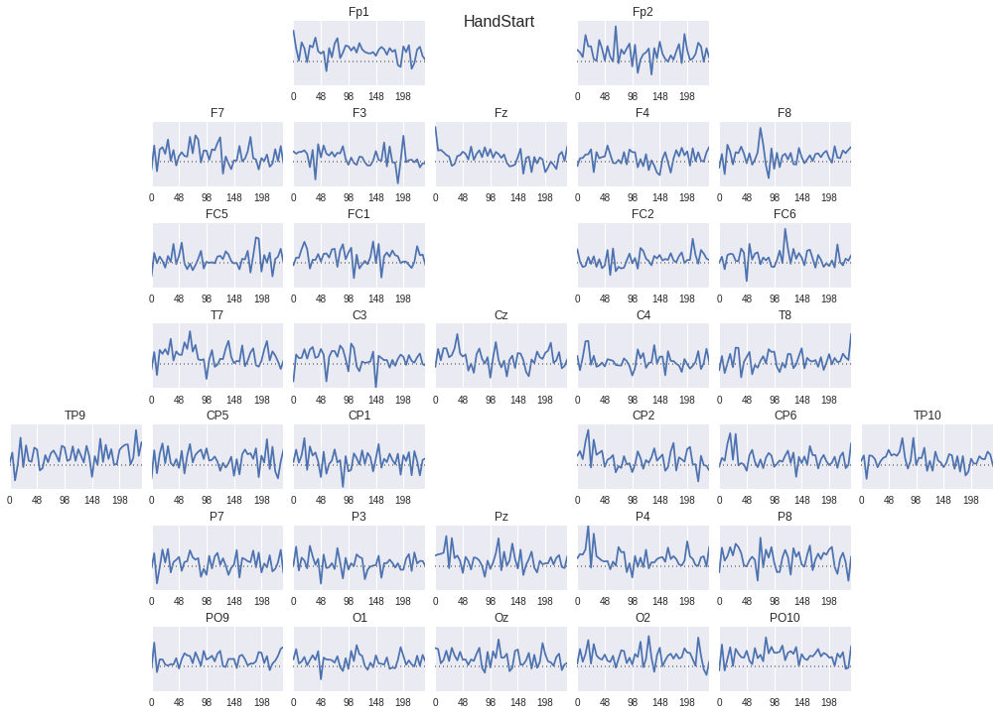

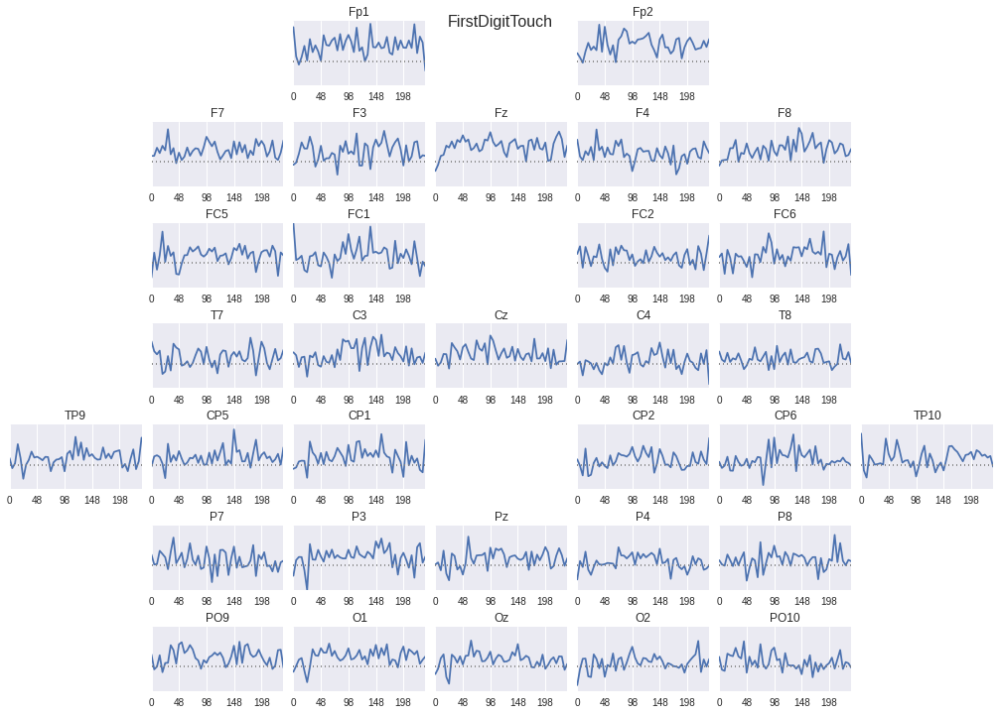

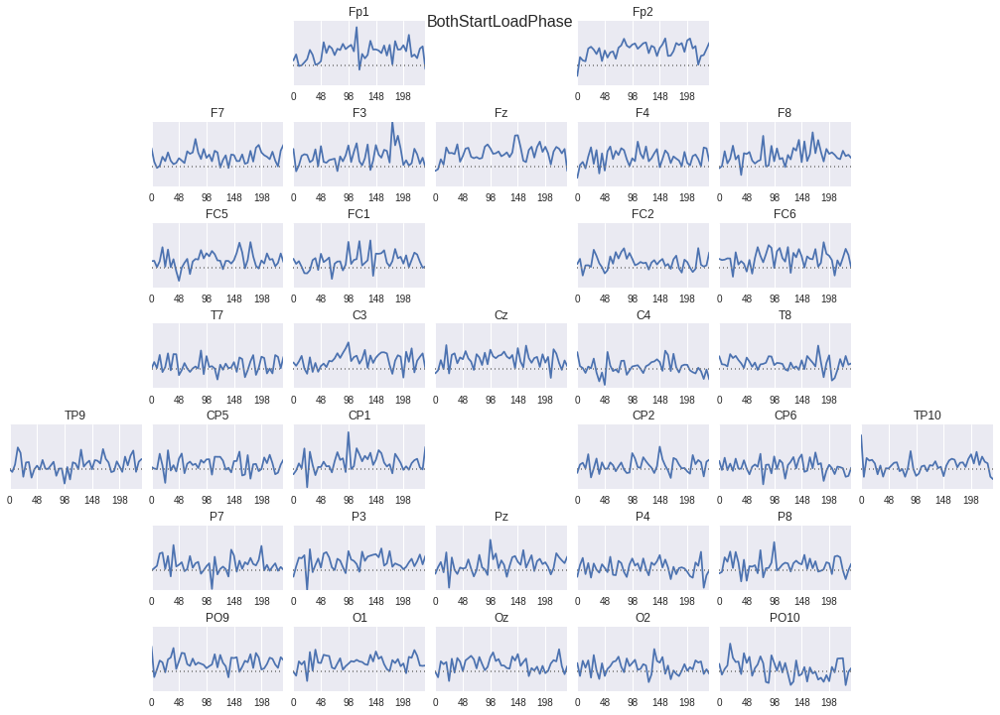

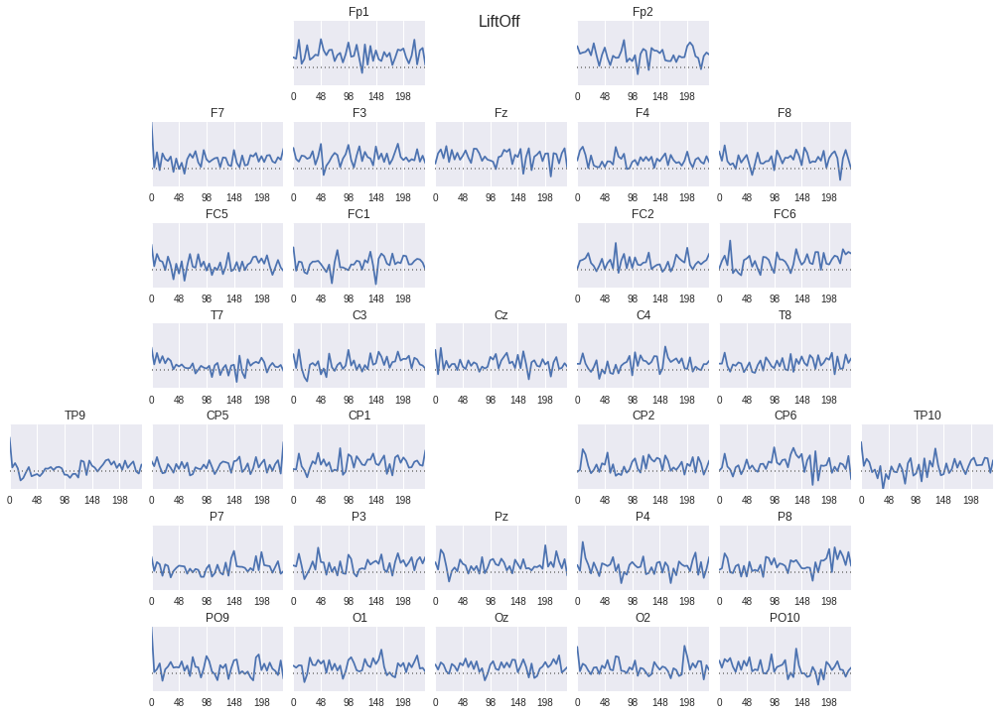

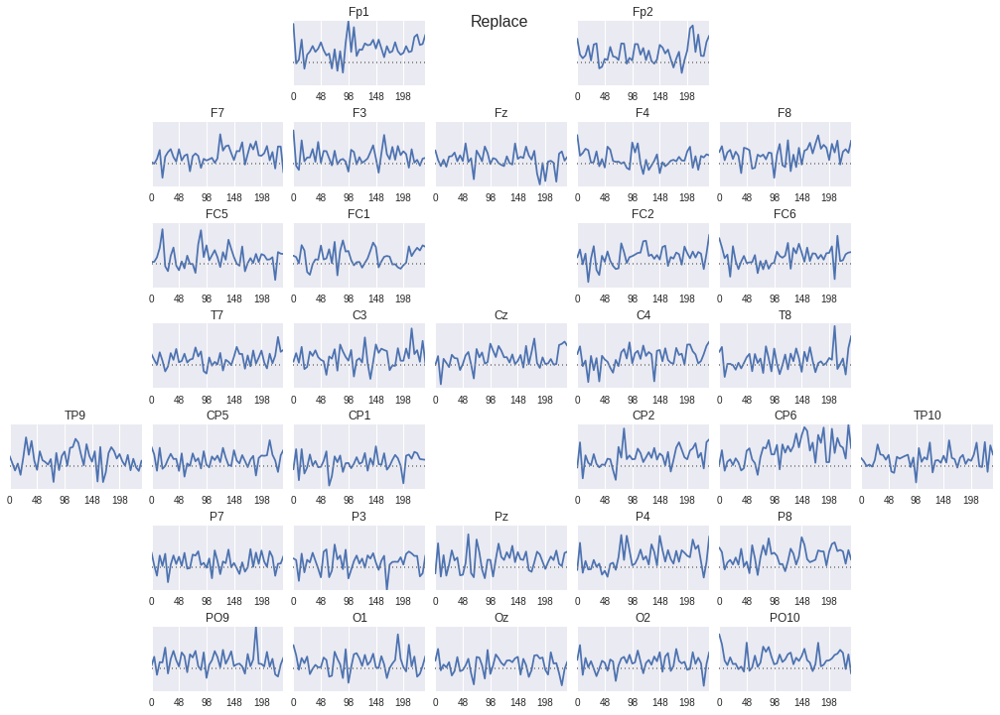

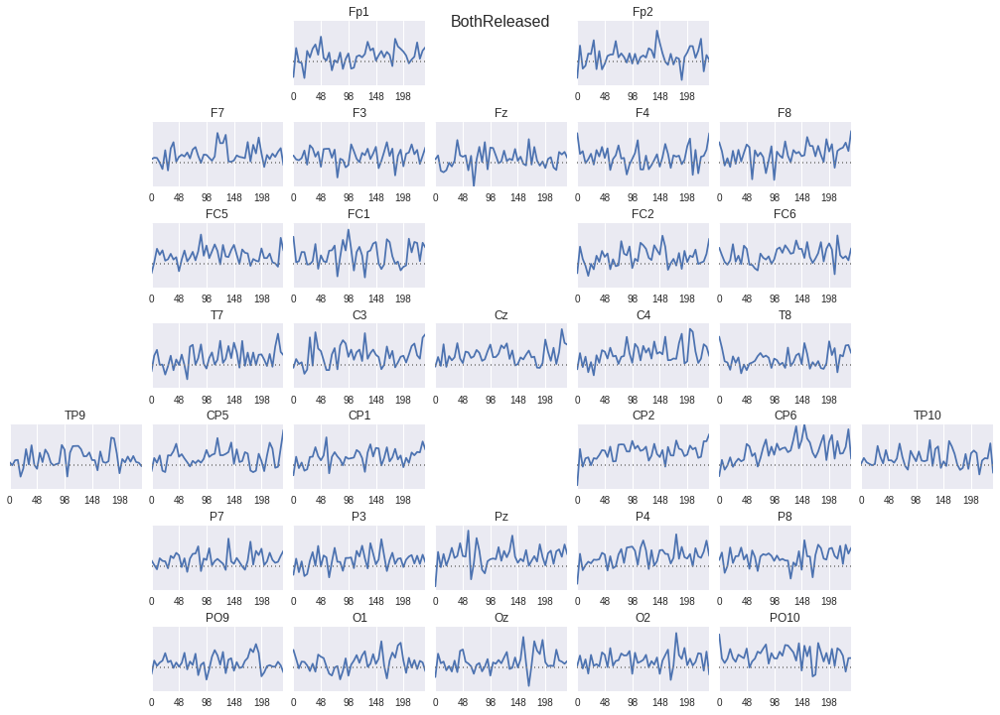

In [343]:
from scikits.samplerate import resample
for i_class in range(6):
    high_low_block_for_class = wanted_blocks_per_class[i_class]

    bps, freqs = bps_and_freqs(high_low_block_for_class, axis=2, sampling_rate=500.0)

    low_bps = bps[-10:]
    high_bps = bps[:10]

    relative_bp = high_bps / np.median(low_bps, axis=0)[np.newaxis,:,:]
    mean_bp = np.mean(relative_bp, axis=0)
    mean_bp = resample(mean_bp.T, 0.4, 'linear').T
    freqs = resample(freqs.T, 0.4, 'linear').T
    fig = plot_head_signals_tight(np.log(mean_bp), kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions,
                           figsize=(14,10))
    plt.xticks(range(len(mean_bp[0]))[::10], np.round(freqs[::10]).astype(np.int32))
    fig.suptitle(class_names[i_class], fontsize=16)
    plt.tight_layout()
    None

### Correlation with different frequencies

I wanted to see which predictions for which classes correlate with which frequency bandpower in which sensors.
So I bandpassed the original signal to the following (self-chosen) filterbands:

(0-5, 5-15,15-35,35-60,60-100,100-150,150-150).

I then computed the envelope of these signals.
I plot the correlations for the predictions for all 6 classes to all these 7 filterbands here.

**Note that the x-axis is not directly time, but the 6 classes** (they do appear sequentially one after the other, but not with the same times between them). Correlations are only between -0.3 and 0.3. Red are higher correlations, blue are anticorrelations.

We can see that there are some higher frequency fairly broadband correlations on F3, Fz, F4 etc.




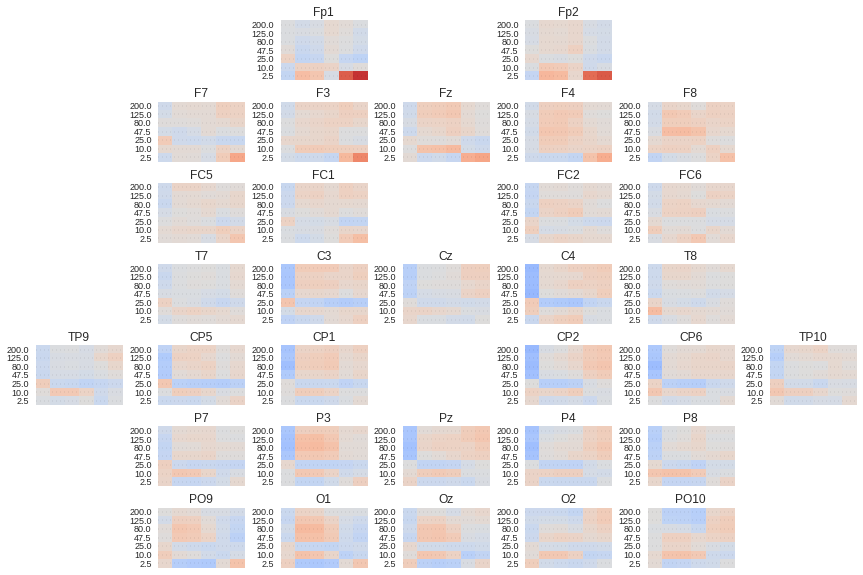

In [474]:
from braindecode.analysis.plot_util import plot_chan_matrices
fig = plot_chan_matrices(corr_preds_env_reshaped.transpose(1,2,0),
                        kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions,
                  colormap=cm.coolwarm,  figsize=(12,8), vmin=-0.3, vmax=0.3)
plt.yticks(np.arange(7) + 0.5, np.mean(filterbands, axis=1))

for ax in fig.axes:
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(9)
plt.tight_layout()
None

#### Open

* Do same analysis with different, non-class units? 
* Maybe with more filterbands? (envelope would maybe be better approximated with narrower bands also)



### Computing relevance of input part to output 

# Code

### Parameters

In [3]:
from braindecode.experiments.load import load_model
from braindecode.veganlasagne.layers import (get_n_sample_preds,
    get_input_shape, get_used_input_length, get_input_var,
    transform_to_normal_net, get_model_input_window)
from braindecode.datasets.grasp_lift import KaggleGraspLiftSet
import numpy as np
from pylearn2.config import yaml_parse

result = np.load('data/models/grasp-lift/all-sub/deeper/batch-norm/2.result.pkl')
model = load_model('data/models/grasp-lift/all-sub/deeper/batch-norm/2.pkl')
train_dict = yaml_parse.load(open('data/models/grasp-lift/all-sub/deeper/batch-norm/2.yaml', 'r'))
normal_net = transform_to_normal_net(model)
assert get_used_input_length(normal_net) == get_input_shape(normal_net)[2] == get_model_input_window(model)

In [4]:
from braindecode.datasets.grasp_lift import KaggleGraspLiftSet
kaggle_set = KaggleGraspLiftSet(data_folder='data/kaggle-grasp-lift/', i_subject=1,
                  resample_half=False, standardize=True)
kaggle_set.load()

In [9]:
import theano
all_layers = lasagne.layers.get_all_layers(model)
# mark nans to be sure you are doing correct transformations
for l in all_layers:
    if hasattr(l, 'invalid_fill_value'):
        l.invalid_fill_value = np.nan
        
preds = lasagne.layers.get_output(all_layers, deterministic=True)
all_layer_cnt_pred_fn = theano.function([get_input_var(model)], preds)

from braindecode.datahandling.batch_iteration import CntWindowsFromCntIterator
from braindecode.veganlasagne.layers import get_input_time_length

iterator = train_dict['exp_args']['iterator']
iterator.input_time_length = get_input_time_length(model)
iterator.n_sample_preds = get_n_sample_preds(model)

from braindecode.datahandling.splitters import KaggleTrainValidTestSplitter
splitter = KaggleTrainValidTestSplitter()

datasets = splitter.split_into_train_valid_test(kaggle_set)

In [10]:
from braindecode.veganlasagne.layers import print_layers

In [12]:
i_layer = 3
all_outs = [all_layer_cnt_pred_fn(batch[0])[i_layer] for batch in iterator.get_batches(datasets['train'], False)]
batch_sizes = [len(batch[0]) for batch in iterator.get_batches(datasets['train'], False)]

In [66]:
from braindecode.veganlasagne.layers import get_3rd_dim_shapes_without_invalids_for_layers
from braindecode.analysis.kaggle import transform_to_cnt_activations, transform_to_time_activations
n_sample_preds = get_n_sample_preds(model)
n_samples = len(datasets['train'].y)
time_activations = transform_to_time_activations(all_outs, batch_sizes)
cnt_activations = transform_to_cnt_activations(time_activations, n_sample_preds, n_samples)

In [67]:
from braindecode.analysis.combine_weights import combine_temporal_spatial_weights
temp_weights = lasagne.layers.get_all_layers(model)[2].W.get_value()
spat_filt_weights = lasagne.layers.get_all_layers(model)[3].W.get_value()
combined_weights = combine_temporal_spatial_weights(temp_weights, spat_filt_weights)

In [135]:
from braindecode.analysis.patterns import transform_conv_weights_to_patterns
    

In [138]:
patterns = transform_conv_weights_to_patterns(combined_weights, test_topo.swapaxes(0,2),
                                  cnt_activations[np.newaxis,:,:,np.newaxis])

In [139]:
scaled_patterns = patterns * np.std(combined_weights) / np.std(patterns)

In [140]:
weights_and_patterns = np.array([combined_weights, scaled_patterns]).transpose(1,2,3,0)

### FFT 

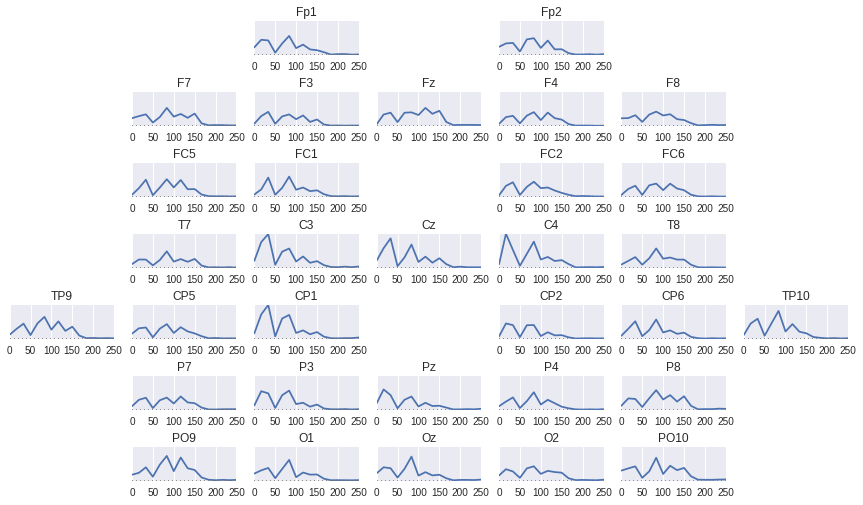

In [159]:
from braindecode.analysis.util import bps_and_freqs


bps, freqs = bps_and_freqs(combined_weights, sampling_rate=500.0,axis=2)

plot_head_signals_tight(np.mean(bps, axis=0), kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions)
plt.xticks(range(bps.shape[2])[::3], np.round(freqs[::3]).astype(np.int32))
plt.tight_layout()
None

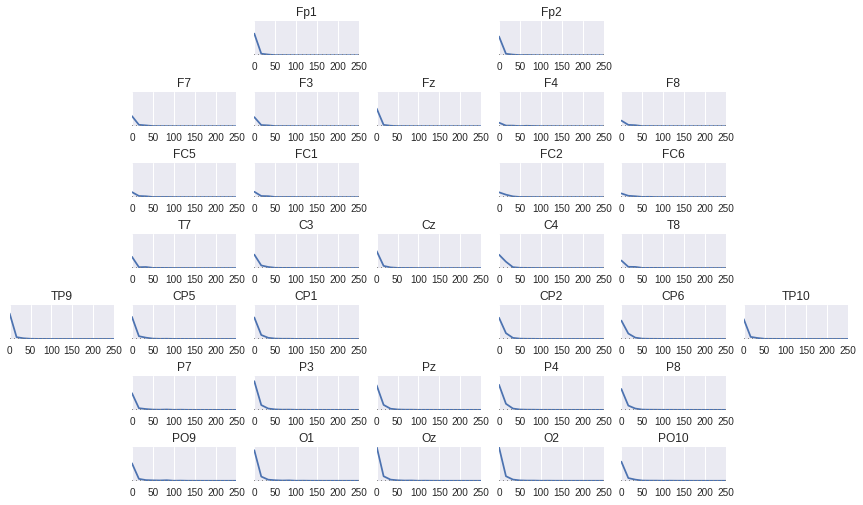

In [158]:

bps, freqs = bps_and_freqs(patterns, sampling_rate=500.0,axis=2)

plot_head_signals_tight(np.mean(bps, axis=0), kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions)
plt.xticks(range(bps.shape[2])[::3], np.round(freqs[::3]).astype(np.int32))
plt.tight_layout()
None

### Probing Network response

In [ ]:
from braindecode.veganlasagne.monitors import get_reshaped_cnt_preds

all_preds_test = [all_layer_cnt_pred_fn(batch[0])[-1] for batch in iterator.get_batches(datasets['test'], False)]
all_preds_test = get_reshaped_cnt_preds(all_preds_test, n_samples =len(datasets['test'].y), 
                input_time_length=iterator.input_time_length,
                n_sample_preds=iterator.n_sample_preds)

In [292]:
def extract_high_to_low_pred_signals(all_preds, topo, i_class, n_preds):
    
    preds_low_to_high_inds = np.argsort(all_preds[:,i_class])

    cur_sorted_preds = deepcopy(preds_low_to_high_inds)
    low_pred_inds = []
    for _ in range(n_preds):
        chosen_ind = cur_sorted_preds[0]
        low_pred_inds.append(chosen_ind)
        # remove all inds close to chosen one
        cur_sorted_preds = cur_sorted_preds[np.logical_or(cur_sorted_preds > chosen_ind + 250,
                                                        cur_sorted_preds < chosen_ind - 250)]

    cur_sorted_preds = deepcopy(preds_low_to_high_inds[::-1])
    high_pred_inds = []
    for _ in range(n_preds):
        chosen_ind = cur_sorted_preds[0]
        high_pred_inds.append(chosen_ind)
        # remove all inds close to chosen one
        cur_sorted_preds = cur_sorted_preds[np.logical_or(cur_sorted_preds > chosen_ind + 250,
                                                        cur_sorted_preds < chosen_ind - 250)]
    # order from high to low...
    wanted_sample_inds = (high_pred_inds + 
                          preds_low_to_high_inds[4000:-4000:12000].tolist()[::-1] + 
                          low_pred_inds[::-1])

    wanted_blocks = [topo[i-250:i].squeeze().T for i in wanted_sample_inds]
    return np.array(wanted_blocks)

In [295]:
wanted_blocks_per_class = []
for i_class in range(6):
    wanted_blocks = extract_high_to_low_pred_signals(all_preds_test, test_topo, i_class=i_class, n_preds=10)
    wanted_blocks_per_class.append(wanted_blocks)

1.  look at class activation, plot 20 low to high for all classes
2.  bandpass signals: [0-5],[5-15],[15-35],[35-60],[60-100],[100-200] , make correlations to lowest layer as well as second + third layer, plot correlational structure by plotting chan matrices (
3. 

In [365]:
import scipy.signal
low_cut_hz = 5
high_cut_hz = 15
def lowpass_topo(topo, high_cut_hz, sampling_rate, axis=0, filt_order=4):
    nyq_freq = 0.5 * sampling_rate
    b, a = scipy.signal.butter(filt_order, high_cut_hz / nyq_freq, btype='lowpass')
    filtered = scipy.signal.filtfilt(b,a, topo, axis=0)
    return filtered

def highpass_topo(topo, low_cut_hz, sampling_rate, axis=0, filt_order=4):
    nyq_freq = 0.5 * sampling_rate
    b, a = scipy.signal.butter(filt_order, low_cut_hz / nyq_freq, btype='highpass')
    filtered = scipy.signal.filtfilt(b,a, topo, axis=0)
    return filtered

def bandpass_topo(topo, low_cut_hz, high_cut_hz, sampling_rate, axis=0, filt_order=4):
    nyq_freq = 0.5 * sampling_rate
    low = low_cut_hz / nyq_freq
    high = high_cut_hz / nyq_freq
    b, a = scipy.signal.butter(filt_order, [low, high], btype='bandpass')
    filtered = scipy.signal.filtfilt(b,a, topo, axis=0)
    return filtered

filtered = bandpass_topo(test_topo, low_cut_hz, high_cut_hz, sampling_rate=500.0, axis=0, filt_order=4)


In [430]:
%%time
filterbands = [[0.0,5.0],[5.0,15.0],[15.0,35.0],[35.0,60.0], 
               [60.0,100.0],[100.0,150.0], [150.0,250.0]]

env_per_filterband = []
for low_cut_hz, high_cut_hz in filterbands:
    if low_cut_hz > 0 and high_cut_hz < 250:
        filtered = bandpass_topo(test_topo, low_cut_hz, 
                                 high_cut_hz, sampling_rate=500.0, axis=0, filt_order=4)
    elif low_cut_hz == 0:
        filtered = lowpass_topo(test_topo, high_cut_hz, 
                            sampling_rate=500.0, axis=0, filt_order=4)
    elif high_cut_hz == 250:
        filtered = highpass_topo(test_topo, low_cut_hz, 
                            sampling_rate=500.0, axis=0, filt_order=4)
        
    
    env = np.abs(scipy.signal.hilbert(filtered, axis=0))
    env_per_filterband.append(env)    
env_per_filterband = np.array(env_per_filterband)
np.save('envelope_subject_1_bandpass.npy', env_per_filterband)
np.save('filterbands_subject_1_bandpass.npy', env_per_filterband)


CPU times: user 5min 8s, sys: 108 ms, total: 5min 8s
Wall time: 5min 8s


In [431]:
env_per_filterband.shape

(7, 117333, 32, 1, 1)

In [432]:
env_for_cov = env_per_filterband.squeeze().swapaxes(1,2).reshape(-1, env_per_filterband.shape[1])


In [433]:
corrcoeff_preds_env = np.corrcoef(all_preds_test.T, env_for_cov)

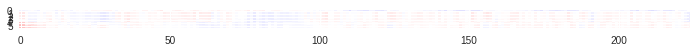

In [434]:
plt.figure(figsize=(12,12))
plt.imshow(corrcoeff_preds_env[:6,6:], interpolation='nearest',
           cmap=cm.bwr,vmin=-1, vmax=1)

In [437]:
corrcoeff_preds_env_cropped= corrcoeff_preds_env[:6,6:]
corrcoeff_preds_env_cropped.shape

(6, 224)

In [472]:
# keep in mind we had this order before after swapaxes
corr_preds_env_reshaped = corrcoeff_preds_env_cropped.T.reshape(env_per_filterband.shape[0],32,-1)
corr_preds_env_reshaped.shape

(7, 32, 6)

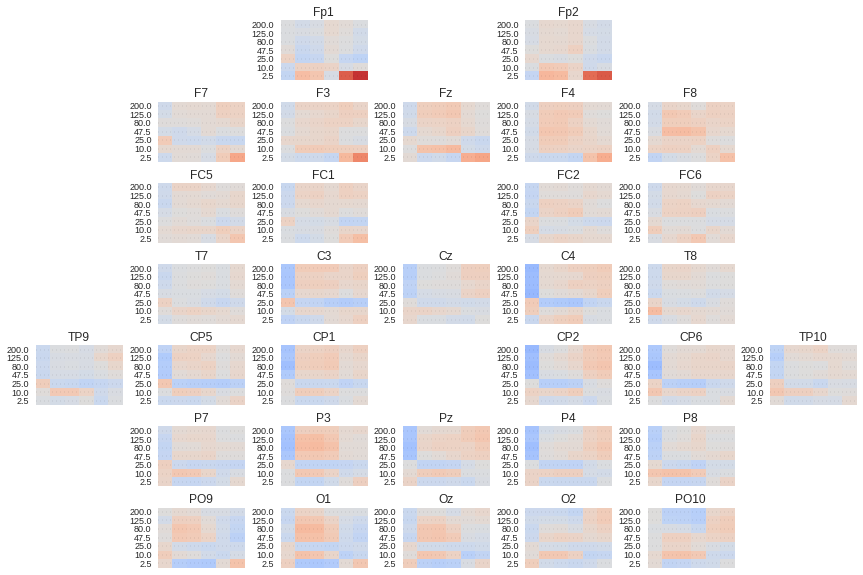

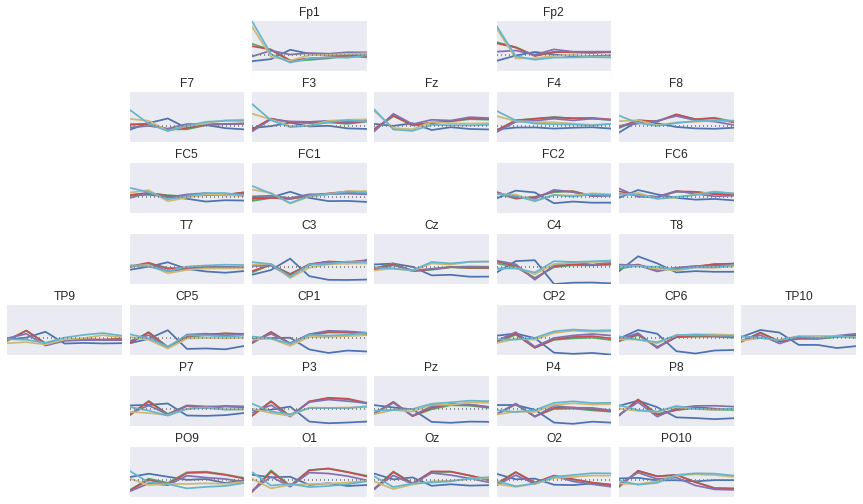

In [441]:

plot_chan_matrices()
plot_head_signals_tight(corr_preds_env_reshaped.transpose(1,0,2), 
                        kaggle_set.sensor_names, sensor_map=tight_Kaggle_positions)
plt.tight_layout()

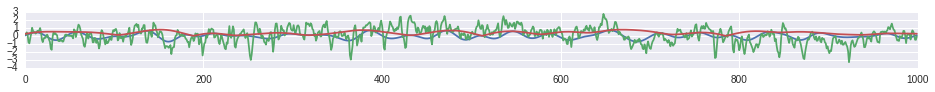

In [359]:
plt.plot(filtered[2000:3000, 0,0,0])
plt.plot(test_topo[2000:3000, 0,0,0])
plt.plot(env[2000:3000, 0,0,0])

In [351]:
test_topo.shape

(117333, 32, 1, 1)

In [50]:
%%capture
import os
import site
site.addsitedir('/home/schirrmr/.local/lib/python2.7/site-packages/')
site.addsitedir('/usr/lib/pymodules/python2.7/')
os.sys.path.insert(0, '/home/schirrmr/braindecode/code/')
%cd /home/schirrmr/braindecode/code/braindecode/
assert 'THEANO_FLAGS' in os.environ
# switch to cpu
#os.environ['THEANO_FLAGS'] = 'floatX=float32,device=cpu,nvcc.fastmath=True'
%load_ext autoreload
%autoreload 2
import logging
import theano.tensor as T
import lasagne
import logging
log = logging.getLogger()
log.setLevel("DEBUG")
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import cm
%matplotlib inline
%config InlineBackend.figure_format = 'png' 

import matplotlib.lines as mlines
import seaborn
seaborn.set_style('darkgrid')
matplotlib.rcParams['figure.figsize'] = (16.0, 1.0)
matplotlib.rcParams['font.size'] = 7